## <mark> 機率三公理(Three Axioms)

    
1. $p(x)\geq0 $
2. $p(\Omega)=1$
3. $\sum\limits_i^n p(x_i)= p\left(\bigcup\limits_{i=1}^n x_i\right)$

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/b/b7/Binomial_Distribution.svg/1024px-Binomial_Distribution.svg.png" width="200" height="50">

## `離散型機率分布`

In [1]:
using Distributions , Gadfly

## `二項分布`

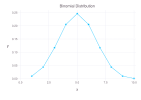

In [2]:
# Binomial Distribution
n=10
p=0.5
bin = Binomial(n,p)
dx = collect(1:10)
dy = [pdf(bin,x) for x in dx] 
plot(x=dx,y=dy,Geom.point,Geom.line,
        Guide.title("Binomial Distribution"))

In [3]:
# Binomial Distribution
n=100
p=0.5
bin = Binomial(n,p)

Binomial{Float64}(n=100, p=0.5)

In [4]:
dx = collect(1:100)
dy = [pdf(bin,x) for x in dx] ;

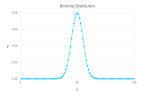

In [5]:
plot(x=dx,y=dy,Geom.point,Geom.line,
        Guide.title("Binomial Distribution"))

## `卜瓦松分布`

In [6]:
# Poisson Distribution
λ=3
poi = Poisson(λ)

Poisson{Float64}(λ=3.0)

In [7]:
dx = collect(0:15)
# dy = [pdf(poi,i) for i in dx]
dy=[]
for i in dx
    point = pdf(poi,i)
    push!(dy,point)
end
dy

16-element Vector{Any}:
 0.049787068367863944
 0.14936120510359185
 0.22404180765538775
 0.22404180765538775
 0.16803135574154085
 0.10081881344492458
 0.05040940672246224
 0.02160403145248386
 0.008101511794681432
 0.002700503931560474
 0.0008101511794681423
 0.00022095032167312998
 5.5237580418282386e-5
 1.2747133942680616e-5
 2.7315287020029872e-6
 5.463057404005969e-7

```
dy=[]
for i in dx
    point = pdf(poi,i)
    push!(dy,point)
end
dy

```

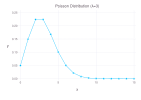

In [8]:
plot(x=dx,y=dy,Geom.point,Geom.line,
    Guide.title("Poisson Distribution (λ=3)"))

In [9]:
pdf(poi,1)

0.14936120510359185

$$f(x)=\frac{e^{-\lambda}\lambda^x}{x!}$$\
$$E(X)=\lambda , Var(X)=\lambda$$
離散型,只有整數點喔!!

In [10]:
# poisson pdf 算法
λ=3
x=1
((exp(1))^(-λ))*(λ)^(x)/factorial(x)

0.14936120510359185

如果硬要試著讓他變成連續，不要嚇到了~~~

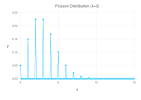

In [11]:
λ=3
poi = Poisson(λ)

dx = collect(0:0.1:15)
dy = [pdf(poi,i) for i in dx]

plot(x=dx,y=dy,Geom.point,Geom.line,
    Guide.title("Poisson Distribution (λ=3)"))

## `常態分布`

$$ f(x) =\frac1{\sqrt{2\pi\sigma^2}}{e}^-\frac{(x-\mu)^2}{2\sigma^2}$$

In [12]:
μ = 5
σ = 1
n = Normal(μ,σ)

Normal{Float64}(μ=5.0, σ=1.0)

In [13]:
dx = collect(0:0.1:10)
dy = [pdf(n,i) for i in dx] ;

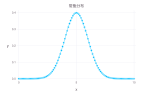

In [14]:
plot(x=dx,y=dy,Geom.point,Geom.line,
        Guide.title("常態分布"))

## `產生模擬資料`

In [15]:
μ=0
σ=1
n=Normal(μ,σ)
data = randn(1000);

dx = collect(-4:0.1:4)
dy = [pdf(n,x) for x in dx];

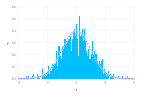

In [16]:
layer1 = layer(x=dx,y=dy,Geom.point,Theme(default_color="#9F7AEA"))
layer2 = layer(x=data,Geom.histogram(density=true))
        
plot(layer1,layer2)

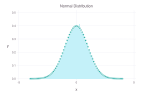

In [17]:
# 增加樣本數 n 
data = randn(100000);

layer1 = layer(x=dx,y=dy,Geom.point,Theme(default_color="#38B2AC"))
layer2 = layer(x=data,Geom.histogram(density=true),Theme(default_color="#C4F1F9"))
        
plot(layer1,layer2,Guide.title("Normal Distribution"))

 **[default_color=]**
 
https://chakra-ui.com/docs/styled-system/theme 

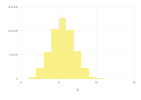

In [18]:
# 二項分布抽樣 近似
n=10
p=0.5
bin = Binomial(n,p)
xs = rand(bin,10000);

plot(x=xs,Geom.histogram,Theme(default_color="#FAF089"),)

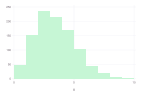

In [19]:
# poisson 近似
ds = rand(poi,1000)
plot(x=ds,Geom.histogram,Theme(default_color="#C6F6D5"))

## `統計量 statistics`

In [20]:
using StatsBase

In [21]:
dx = randn(10000);

In [22]:
mean(dx)  # E(X)=0

-0.008237512089337444

In [23]:
var(dx)   # Var(x)=1

1.0224220392153232

In [24]:
std(dx)

1.0111488709459766

In [25]:
# 資料 乘兩倍
dx = 2*dx 
mean_and_var(dx)

(-0.01647502417867489, 4.089688156861293)

In [26]:
mean_and_std(dx)

(-0.01647502417867489, 2.022297741891953)

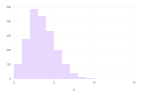

In [27]:
λ = 3
p = Poisson(λ)

dx = rand(p,2000)

plot(x=dx,Geom.histogram,Theme(default_color="#E9D8FD"))

In [28]:
median(dx)

3.0

## `百分位數 (percentile)`

In [29]:
percentile(dx,5)

0.0

In [30]:
percentile(dx,50)

3.0

In [31]:
percentile(dx,75)

4.0

In [32]:
## 分位數 quantile (0~1)
quantile(dx,0.25)

2.0

In [33]:
quantile(dx,0.75)

4.0

In [34]:
nquantile(dx,4)  # 計算 N 分位數

5-element Vector{Float64}:
  0.0
  2.0
  3.0
  4.0
 10.0

In [35]:
# iqr 四分位距

In [36]:
iqr(dx)   # quantile(dx,0.75)-quantile(dx,0.25)

2.0

In [37]:
quantile(dx,0.75)-quantile(dx,0.25)

2.0

## `MAD (median absolute deviation)`

$$MAD=median(|x_i-	\tilde{x}|), \,	\tilde{x}=median(x_i)$$

In [38]:
mad(dx)

1.4826022185056018

In [39]:
# 眾數
mode(dx)

2

In [40]:
maximum(dx)

10

In [41]:
minimum(dx)

0

In [42]:
## 統計摘要
summarystats(dx)

Summary Stats:
Length:         2000
Missing Count:  0
Mean:           2.973500
Minimum:        0.000000
1st Quartile:   2.000000
Median:         3.000000
3rd Quartile:   4.000000
Maximum:        10.000000


In [43]:
using DataFrames

df = DataFrame(A = [1, 2,4,26,23], B = [1.0, missing,1,0,0], C = ["a", "b","c","d","e"])


Row,A,B,C
,Int64,Float64?,String
1,1,1.0,a
2,2,missing,b
3,4,1.0,c
4,26,0.0,d
5,23,0.0,e


In [44]:
describe(df)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Int64,Type
1,A,11.2,1,4.0,26,0,Int64
2,B,0.5,0.0,0.5,1.0,1,"Union{Missing, Float64}"
3,C,,a,,e,0,String


## `幾何平均數`

In [45]:
geomean(dx)

0.0

## `調和平均數`

In [46]:
harmmean(dx)

0.0

## `偏度`

In [47]:
skewness(dx)

0.514588702292677

## `峰度`

In [48]:
kurtosis(dx)

0.12156271305984534

## `動差 (k-th moment)`

In [49]:
mean(dx)

2.9735

In [50]:
moment(dx,1)

-8.832934383917746e-16

In [51]:
moment(dx,2)

2.860797749999975

In [52]:
var(dx)

2.8622288644322156

In [53]:
# 動差??
?moment

LoadError: syntax: invalid identifier name "?"

## `理論`
1. 母體 population
2. 樣本 sample
3. 抽樣 sampling

In [54]:
using RDatasets , Gadfly

In [55]:
iris = dataset("datasets","iris")

Row,SepalLength,SepalWidth,PetalLength,PetalWidth,Species
,Float64,Float64,Float64,Float64,Cat…
1,5.1,3.5,1.4,0.2,setosa
2,4.9,3.0,1.4,0.2,setosa
3,4.7,3.2,1.3,0.2,setosa
4,4.6,3.1,1.5,0.2,setosa
5,5.0,3.6,1.4,0.2,setosa
6,5.4,3.9,1.7,0.4,setosa
7,4.6,3.4,1.4,0.3,setosa
8,5.0,3.4,1.5,0.2,setosa
9,4.4,2.9,1.4,0.2,setosa


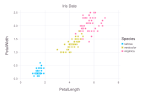

In [56]:
plot(iris,x="PetalLength",y="PetalWidth",
        color="Species",Geom.point,
        Guide.title("Iris Date"))

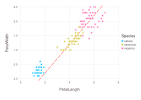

In [57]:
# 截線 Geom.abline

plot(iris,x="PetalLength",y="PetalWidth",
        color="Species",Geom.point,
        intercept=[-0.8],slope=[0.5],
        Geom.abline(color="red",style=:dash))

In [58]:
μ = mean(iris[:,:PetalLength])

3.7580000000000005

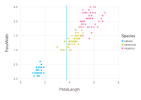

In [59]:
plot(iris,x="PetalLength",y="PetalWidth",
        color="Species",Geom.point,
        xintercept=[μ],Geom.vline)

In [60]:
μ2 = mean(iris[:,:PetalWidth])

1.1993333333333336

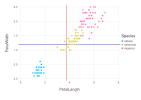

In [61]:
plot(iris,x="PetalLength",y="PetalWidth",
        color="Species",Geom.point,
        yintercept=[μ2],Geom.hline(color=["blue"]),
        xintercept=[μ],Geom.vline(color=["red"]))

## `熱圖 (heatmap)`

1. Geom.histogram2d
2. Geom.rectbin

In [62]:
data = dataset("Car","Womenlf")

first(data,6)

Row,Partic,HIncome,Children,Region
,Cat…,Int32,Cat…,Cat…
1,not.work,15,present,Ontario
2,not.work,13,present,Ontario
3,not.work,45,present,Ontario
4,not.work,23,present,Ontario
5,not.work,19,present,Ontario
6,not.work,7,present,Ontario


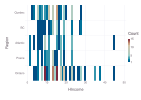

In [63]:
plot(data,x="HIncome",y="Region",Geom.histogram2d)

# 次數多 > red  //  少 > blue

In [64]:
esoph = dataset("datasets","esoph")
first(esoph,6)

Row,AgeGp,AlcGp,TobGp,NCases,NControls
,Cat…,Cat…,Cat…,Int32,Int32
1,25-34,0-39g/day,0-9g/day,0,40
2,25-34,0-39g/day,10-19,0,10
3,25-34,0-39g/day,20-29,0,6
4,25-34,0-39g/day,30+,0,5
5,25-34,40-79,0-9g/day,0,27
6,25-34,40-79,10-19,0,7


In [65]:
# 需要自己計算格子 顏色

esoph[:,:ratio] = esoph[:,:NCases] ./ (esoph[:,:NControls].+ esoph[:,:NCases]) ;

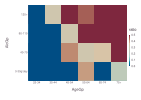

In [66]:
plot(esoph,x="AgeGp",y="AlcGp",
            color="ratio",Geom.rectbin)

## `資料密度`

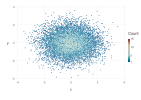

In [67]:
plot(x=randn(10000),y=randn(10000),Geom.hexbin)

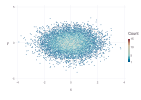

In [68]:
plot(x=randn(10000),y=randn(10000),
        Geom.hexbin,Geom.ellipse,Theme(default_color="red"))

## `橢圓(分組 group="g")`

In [69]:
d = dataset("datasets","faithful")
first(d,5)

Row,Eruptions,Waiting
,Float64,Int64
1,3.6,79
2,1.8,54
3,3.333,74
4,2.283,62
5,4.533,85


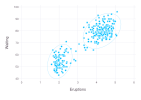

In [70]:
d[:,:g] = d[:,:Eruptions] .> 3.0

plot(d ,x="Eruptions",y="Waiting",
        Geom.point,group="g",Geom.ellipse)

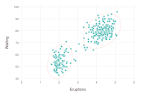

In [71]:
layer1 = layer(x="Eruptions",y="Waiting",Geom.point,Theme(default_color="#38B2AC"))
layer2 = layer(x="Eruptions",y="Waiting",group="g",
            Geom.ellipse,Theme(default_color="red")) #97266D"))

plot(d,layer1,layer2)

## `等高線圖 (密度圖)`

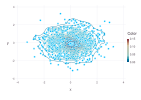

In [72]:
plot(x=randn(1000),y=randn(1000),
        Geom.density2d,Geom.point,Scale.color_continuous)

## `聯合機率分布 joint pdf `


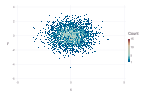

In [73]:
using DataFrames

df = DataFrame(x=randn(10000),y=randn(10000))
    
plot(df,x="x",y="y",Geom.histogram2d)

## `邊際機率分布 marginal pdf `

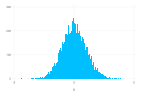

In [74]:
plot(df,x="x",Geom.histogram)

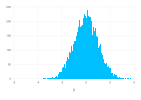

In [75]:
plot(df,x="y",Geom.histogram)

## `地景描繪`

In [76]:
# 繪製 雙變量函數 的樣子

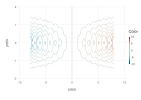

In [77]:
f(x,y) = x*exp(-(x-round(Int,x))^2-y^2)

plot(z=f,xmin=[-8],xmax=[8],ymin=[-2],ymax=[2],Geom.contour)

### ` 自己選個二維函數`


$$f(x,y) = \frac{x-y}{1+x^2+y^2}$$

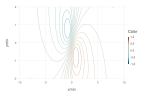

In [78]:
f(x,y) = (x-y)/(1+x^2+y^2)

plot(z=f,xmin=[-8],xmax=[8],ymin=[-2],ymax=[2],Geom.contour)

## `繪製火山地形-等高線`

In [79]:
volcano = Matrix(dataset("datasets","volcano"))

first(volcano,4)

4-element Vector{Int64}:
 100
 101
 102
 103

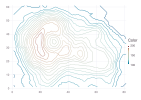

In [80]:
coord = Coord.cartesian(xmin=0,xmax=80,ymin=0,ymax=60)
plot(coord,z=volcano,Geom.contour)

## `繪製向量場 (參考)`

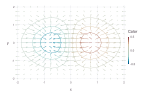

In [81]:
coord = Coord.cartesian(xmin=-2,xmax=2,ymin=-2,ymax=2)

plot(coord,z=(x,y)->x*exp(-(x^2+y^2)),x=-2:0.25:2,y=-2:0.25:2,
        Geom.vectorfield(scale=0.4,samples=17),Geom.contour(levels=6),
    Scale.x_continuous(minvalue=-2,maxvalue=2),
    Scale.y_continuous(minvalue=-2,maxvalue=2))

## `分析 : 相關性`

In [82]:
iris = dataset("datasets","iris")

iris[1:4,:]

Row,SepalLength,SepalWidth,PetalLength,PetalWidth,Species
,Float64,Float64,Float64,Float64,Cat…
1,5.1,3.5,1.4,0.2,setosa
2,4.9,3.0,1.4,0.2,setosa
3,4.7,3.2,1.3,0.2,setosa
4,4.6,3.1,1.5,0.2,setosa


### `皮爾森相關係數 Pearson correlation coefficient`

In [83]:
cor(iris[:,:PetalLength],iris[:,:PetalWidth])

0.9628654314027961

In [84]:
X = Matrix(iris[:,[:PetalLength,:PetalWidth]])
X[1:5,:]

5×2 Matrix{Float64}:
 1.4  0.2
 1.4  0.2
 1.3  0.2
 1.5  0.2
 1.4  0.2

In [85]:
cor(X)   # 變方矩陣 

2×2 Matrix{Float64}:
 1.0       0.962865
 0.962865  1.0

In [86]:
# 共變異數 covariance
cov(iris[:,:PetalLength],iris[:,:PetalWidth])

1.2956093959731547

In [87]:
# 共變異數矩陣 covariance matrix
cov(X)

2×2 Matrix{Float64}:
 3.11628  1.29561
 1.29561  0.581006

## `期望值`

In [88]:
mean_and_cov(X)

([3.7580000000000005 1.1993333333333336], [3.116277852348994 1.2956093959731545; 1.2956093959731545 0.5810062639821025])

In [89]:
# z 值

zscore(iris[:,:PetalLength])[1:5]

5-element Vector{Float64}:
 -1.33575163424152
 -1.33575163424152
 -1.3923992862449772
 -1.279103982238063
 -1.33575163424152

### `斯皮爾曼等級相關係數 (Spearman correlation coefficient)`

<img src="https://upload.wikimedia.org/wikipedia/commons/thumb/4/4e/Spearman_fig1.svg/1024px-Spearman_fig1.svg.png"  width ="300">

In [90]:
corspearman(iris[:,:PetalLength],iris[:,:PetalWidth])

0.9376668235763412

In [91]:
# Kendall等級相關係數

# Kendall rank correlation coefficient
corkendall(iris[:,:PetalLength],iris[:,:PetalWidth])

0.8068906859884751

## <mark> 探索式資料分析

In [92]:
airquality = dataset("datasets","airquality")

first(airquality,5)

Row,Ozone,Solar.R,Wind,Temp,Month,Day
,Int64?,Int64?,Float64,Int64,Int64,Int64
1,41,190,7.4,67,5,1
2,36,118,8.0,72,5,2
3,12,149,12.6,74,5,3
4,18,313,11.5,62,5,4
5,missing,missing,14.3,56,5,5


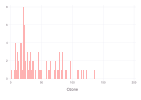

In [93]:
plot(airquality,x="Ozone",Geom.histogram,
        Theme(default_color="#FEB2B2"))

In [94]:
# 髮色 瞳孔顏色 性別
haireyecolor = dataset("datasets","HairEyeColor")
first(haireyecolor,5)

Row,Hair,Eye,Sex,Freq
,String7,String7,String7,Int64
1,Black,Brown,Male,32
2,Brown,Brown,Male,53
3,Red,Brown,Male,10
4,Blond,Brown,Male,3
5,Black,Blue,Male,11


In [95]:
using Statistics

# 修正  haircolor = by(haireyecolor,:Hair,Freq=:Freq => sum)

# 嘗試使用 groupby , combine

haircolor = groupby(haireyecolor,:Hair)
haircolor = combine(haircolor,:Freq => sum)

## 將各種髮色，次數和呈現

Row,Hair,Freq_sum
,String7,Int64
1,Black,108
2,Brown,286
3,Red,71
4,Blond,127


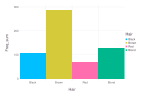

In [96]:
plot(haircolor,x="Hair",y="Freq_sum",color="Hair",Geom.bar)

In [97]:
haircolor[:,:Hair]

4-element PooledArrays.PooledVector{InlineStrings.String7, UInt32, Vector{UInt32}}:
 "Black"
 "Brown"
 "Red"
 "Blond"

In [98]:
haircolor[:,:Freq_sum]

4-element Vector{Int64}:
 108
 286
  71
 127

## `Pie`

In [99]:
pie(haircolor[:,:Freq_sum],labels=haircolor[:,:Hair],
    explode=[0,0,0.2,0],shadow=true, startangle=90,autopct="%1.0f%%")

LoadError: UndefVarError: pie not defined

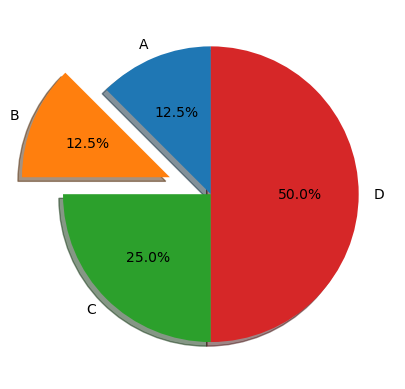

(PyCall.PyObject[PyObject <matplotlib.patches.Wedge object at 0x0000012D080BB9A0>, PyObject <matplotlib.patches.Wedge object at 0x0000012D0810C1C0>, PyObject <matplotlib.patches.Wedge object at 0x0000012D0810CA90>, PyObject <matplotlib.patches.Wedge object at 0x0000012D0810D360>], PyCall.PyObject[PyObject Text(-0.42095177560159874, 1.0162674857624154, 'A'), PyObject Text(-1.2934313455158015, 0.5357568053111259, 'B'), PyObject Text(-0.7778174593052025, -0.7778174593052023, 'C'), PyObject Text(1.1, -2.6942229581241775e-16, 'D')], PyCall.PyObject[PyObject Text(-0.22961005941905382, 0.5543277195067721, '12.5%'), PyObject Text(-0.831491579260158, 0.3444150891285809, '12.5%'), PyObject Text(-0.4242640687119286, -0.42426406871192845, '25.0%'), PyObject Text(0.6, -1.4695761589768238e-16, '50.0%')])

In [100]:
using PyPlot
pie([15,15,30,60], explode=[0,0.3,0,0], labels=["A","B","C","D"], 
autopct="%1.1f%%", shadow=true, startangle=90)


## `longley 資料集 分析`

In [101]:
longley =dataset("datasets","longley")
first(longley,4)

Row,Year,GNPDeflator,GNP,Unemployed,ArmedForces,Population,Year_1,Employed
,Int64,Float64,Float64,Float64,Float64,Float64,Int64,Float64
1,1947,83.0,234.289,235.6,159.0,107.608,1947,60.323
2,1948,88.5,259.426,232.5,145.6,108.632,1948,61.122
3,1949,88.2,258.054,368.2,161.6,109.773,1949,60.171
4,1950,89.5,284.599,335.1,165.0,110.929,1950,61.187


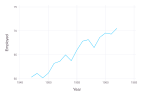

In [102]:
plot(longley,x="Year",y="Employed",Geom.line)

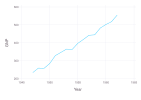

In [103]:
plot(longley,x="Year",y="GNP",Geom.line)

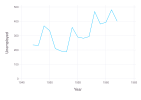

In [104]:
plot(longley,x="Year",y="Unemployed",Geom.line)

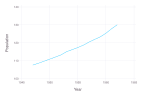

In [105]:
plot(longley,x="Year",y="Population",Geom.line)

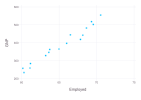

In [106]:
# 確認 相關性
plot(longley,x="Employed",y="GNP",Geom.point) 

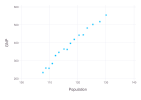

In [107]:
plot(longley,x="Population",y="GNP",Geom.point) 

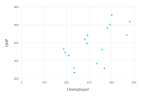

In [108]:
plot(longley,x="Unemployed",y="GNP",Geom.point) 